## Import ccssm json into pandas dataframe

In [3]:
import json

In [4]:
import pandas as pd

In [5]:
with open("standards.json") as json_data:
    standards = json.load(json_data)

df = pd.DataFrame.from_dict(standards['standards'], orient='columns')
df.set_index("name", drop=True, inplace=True)
df

,grade,domain,description,from,to
name,,,,,
K.CC.1,Kindergarten,Counting and Cardinality,Count to 100 by ones and by tens.,[],"[K.CC.2, K.CC.4, 1.NBT.1]"
K.CC.2,Kindergarten,Counting and Cardinality,Count forward beginning from a given number wi...,[K.CC.1],[K.CC.4]
K.CC.3,Kindergarten,Counting and Cardinality,Write numbers from 0 to 20. Represent a number...,[],[]
K.CC.4,Kindergarten,Counting and Cardinality,Understand the relationship between numbers an...,"[K.CC.1, K.CC.2]","[K.CC.5, 1.OA.5]"
K.CC.5,Kindergarten,Counting and Cardinality,Count to answer “how many?” questions about as...,[K.CC.4],[K.CC.6]
...,...,...,...,...,...
8.G.9,8th Grade,Geometry,"Know the formulas for the volumes of cones, cy...",[8.EE.2],"[HS.G-GMD.1, HS.G-GMD.2, HS.G-GMD.3, HS.G-MG.1..."
8.SP.1,8th Grade,Statistics and Probability,Construct and interpret scatter plots for biva...,[6.NS.8],"[8.SP.2, HS.S-ID.6c, HS.S-ID.9]"
8.SP.2,8th Grade,Statistics and Probability,Know that straight lines are widely used to mo...,[8.SP.1],"[8.SP.3, HS.S-ID.6b, HS.S-ID.6c, HS.S-ID.8]"


## Verify edges

In [6]:
for std in df.index:
    for successor in df.loc[std, "to"]:
        if "HS" not in successor:
            if std not in df.loc[successor, "from"]:
                print(std + " not in " + successor)
print("all done")

all done


In [7]:
for std in df.index:
    for predecessor in df.loc[std, "from"]:
        if std not in df.loc[predecessor, "to"]:
            print(std + " not in " + predecessor)
print("all done")

all done


## Visualize ccssm as a force directed graph using d3graph library

In [8]:
from d3graph import d3graph, vec2adjmat

In [9]:
source = []
target = []
num_targets = 0
for std in df.index:
    num_targets = 0
    for successor in df.loc[std, "to"]:
        if "HS" not in successor:
            source.append(std)
            target.append(successor)
            num_targets += 1
    if num_targets == 0:
        source.append(std)
        target.append(std)
adjmat = vec2adjmat(source, target)
adjmat

target,1.G.1,1.G.2,1.G.3,1.MD.1,1.MD.2,1.MD.4,1.NBT.1,1.NBT.2,1.NBT.3,1.NBT.4,...,7.G.2,7.SP.5,8.G.7,K.CC.1,K.G.1,K.G.2,K.G.3,K.G.6,K.MD.1,K.OA.1
source,,,,,,,,,,,,,,,,,,,,,
1.G.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1.G.2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1.G.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1.MD.1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1.MD.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
K.G.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
K.G.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
K.G.6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
# Initialize
d3 = d3graph()
# Proces adjmat
d3.graph(adjmat)

[d3graph] INFO> Set directed=True to see the markers!
[d3graph] INFO> Keep only edges with weight>0
[d3graph] INFO> Converting source-target into adjacency matrix..
[d3graph] INFO> Making the matrix symmetric..
[d3graph] INFO> Converting adjacency matrix into source-target..
[clustimage] >WARNING> Colormap [Set2] can not create [13] unique colors! Available unique colors: [8].
[d3graph] WARNING> Colormap [Set2] can not create [13] unique colors! Available unique colors: [8].
[d3graph] INFO> Number of unique nodes: 220


In [11]:
# For some reason singleton standards are excluded from the graph
for std in df.index:
    if std not in d3.node_properties:
        print(std)

K.CC.3
2.MD.8
2.MD.9
3.MD.1
3.MD.3
7.EE.2
7.G.3
8.NS.2
8.SP.4


In [12]:
colordict = {"Kindergarten": "#1f77b4", 
             "1st Grade": "#ff7f0e",
             "2nd Grade": "#2ca02c",
             "3rd Grade": "#d62728",
             "4th Grade": "#9467bd",
             "5th Grade": "#8c564b",
             "6th Grade": "#e377c2",
             "7th Grade": "#bcbd22",
             "8th Grade": "#17becf"}

In [13]:
d3.set_node_properties(tooltip = [std + "\n" + df.loc[std, "description"] for std in d3.node_properties.keys()],
                       color = [colordict[df.loc[std,"grade"]] for std in d3.node_properties.keys()],
                       size = "degree")
d3.set_edge_properties(directed=True)

[d3graph] INFO> Number of unique nodes: 220
[d3graph] INFO> Keep only edges with weight>0
[d3graph] INFO> Converting source-target into adjacency matrix..
[d3graph] INFO> Making the matrix symmetric..


In [14]:
d3.show()

[d3graph] INFO> Slider range is set to [0, 1]
[d3graph] INFO> Write to path: [/tmp/tmpthbiomow/d3graph.html]
[d3graph] INFO> File already exists and will be overwritten: [/tmp/tmpthbiomow/d3graph.html]


## vertex analysis

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
df_degree = df.copy(deep=True)
df_degree["from"] = df_degree["from"].apply(len)
df_degree["to"] = df_degree["to"].apply(len)
df_degree

,grade,domain,description,from,to
name,,,,,
K.CC.1,Kindergarten,Counting and Cardinality,Count to 100 by ones and by tens.,0,3
K.CC.2,Kindergarten,Counting and Cardinality,Count forward beginning from a given number wi...,1,1
K.CC.3,Kindergarten,Counting and Cardinality,Write numbers from 0 to 20. Represent a number...,0,0
K.CC.4,Kindergarten,Counting and Cardinality,Understand the relationship between numbers an...,2,2
K.CC.5,Kindergarten,Counting and Cardinality,Count to answer “how many?” questions about as...,1,1
...,...,...,...,...,...
8.G.9,8th Grade,Geometry,"Know the formulas for the volumes of cones, cy...",1,5
8.SP.1,8th Grade,Statistics and Probability,Construct and interpret scatter plots for biva...,1,3
8.SP.2,8th Grade,Statistics and Probability,Know that straight lines are widely used to mo...,1,4


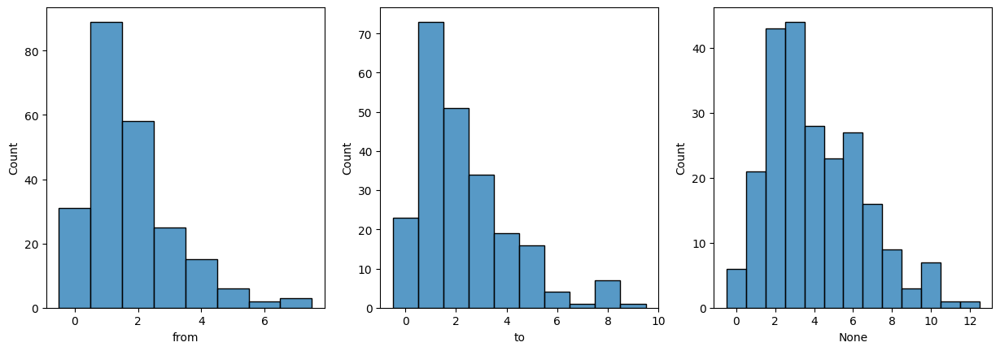

In [17]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
fig.set_figwidth(15)
sns.histplot(data=df_degree, x="from", discrete=True, ax=ax1)
sns.histplot(data=df_degree, x="to", discrete=True, ax=ax2)
degree = df_degree["from"] + df_degree["to"]
sns.histplot(x = degree, discrete=True, ax=ax3)
plt.show()

In [18]:
df_degree["degree"] = degree

### Highest degree

In [19]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df_degree.sort_values("degree", ascending=False))

,grade,domain,description,from,to,degree
name,,,,,,
7.RP.2,7th Grade,Ratios and Proportional Relationships,Recognize and represent proportional relations...,3,9,12
8.EE.8,8th Grade,Expressions and Equations,Analyze and solve pairs of simultaneous linear...,3,8,11
2.NBT.1,2nd Grade,Number and Operations in Base Ten,Understand that the three digits of a three-di...,2,8,10
5.NBT.1,5th Grade,Number and Operations in Base Ten,"Recognize that in a multi-digit number, a digi...",4,6,10
3.OA.1,3rd Grade,Operations and Algebraic Thinking,"Interpret products of whole numbers, e.g., int...",2,8,10
3.OA.5,3rd Grade,Operations and Algebraic Thinking,Apply properties of operations as strategies t...,2,8,10
4.NF.3,4th Grade,Number and Operations—Fractions,Understand a fraction a/b with a > 1 as a sum ...,7,3,10
7.EE.1,7th Grade,Expressions and Equations,Apply properties of operations as strategies t...,2,8,10
8.F.4,8th Grade,Functions,Construct a function to model a linear relatio...,2,8,10


### Most in

In [20]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df_degree.sort_values("from", ascending=False))

,grade,domain,description,from,to,degree
name,,,,,,
1.OA.6,1st Grade,Operations and Algebraic Thinking,"Add and subtract within 20, demonstrating flue...",7,2,9
4.NF.3,4th Grade,Number and Operations—Fractions,Understand a fraction a/b with a > 1 as a sum ...,7,3,10
5.NF.5,5th Grade,Number and Operations—Fractions,Interpret multiplication as scaling (resizing)...,7,1,8
5.NF.3,5th Grade,Number and Operations—Fractions,Interpret a fraction as division of the numera...,6,2,8
4.NBT.6,4th Grade,Number and Operations in Base Ten,Find whole-number quotients and remainders wit...,6,2,8
4.MD.2,4th Grade,Measurement and Data,Use the four operations to solve word problems...,5,4,9
4.NBT.5,4th Grade,Number and Operations in Base Ten,Multiply a whole number of up to four digits b...,5,2,7
5.NBT.7,5th Grade,Number and Operations in Base Ten,"Add, subtract, multiply, and divide decimals t...",5,2,7
5.NF.6,5th Grade,Number and Operations—Fractions,Solve real world problems involving multiplica...,5,1,6


### Most out

In [21]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df_degree.sort_values("to", ascending=False))

,grade,domain,description,from,to,degree
name,,,,,,
7.RP.2,7th Grade,Ratios and Proportional Relationships,Recognize and represent proportional relations...,3,9,12
3.OA.1,3rd Grade,Operations and Algebraic Thinking,"Interpret products of whole numbers, e.g., int...",2,8,10
3.OA.5,3rd Grade,Operations and Algebraic Thinking,Apply properties of operations as strategies t...,2,8,10
7.EE.1,7th Grade,Expressions and Equations,Apply properties of operations as strategies t...,2,8,10
8.EE.8,8th Grade,Expressions and Equations,Analyze and solve pairs of simultaneous linear...,3,8,11
2.NBT.1,2nd Grade,Number and Operations in Base Ten,Understand that the three digits of a three-di...,2,8,10
4.OA.2,4th Grade,Operations and Algebraic Thinking,Multiply or divide to solve word problems invo...,1,8,9
8.F.4,8th Grade,Functions,Construct a function to model a linear relatio...,2,8,10
6.SP.2,6th Grade,Statistics and Probability,Understand that a set of data collected to ans...,1,7,8


### Sources (+) and Sinks (-)

In [22]:
df_degree["difference"] = df_degree["to"] - df_degree["from"]

In [23]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df_degree.sort_values(["difference", "to"], ascending=False))

,grade,domain,description,from,to,degree,difference
name,,,,,,,
4.OA.2,4th Grade,Operations and Algebraic Thinking,Multiply or divide to solve word problems invo...,1,8,9,7
7.RP.2,7th Grade,Ratios and Proportional Relationships,Recognize and represent proportional relations...,3,9,12,6
2.NBT.1,2nd Grade,Number and Operations in Base Ten,Understand that the three digits of a three-di...,2,8,10,6
3.OA.1,3rd Grade,Operations and Algebraic Thinking,"Interpret products of whole numbers, e.g., int...",2,8,10,6
3.OA.5,3rd Grade,Operations and Algebraic Thinking,Apply properties of operations as strategies t...,2,8,10,6
7.EE.1,7th Grade,Expressions and Equations,Apply properties of operations as strategies t...,2,8,10,6
8.F.4,8th Grade,Functions,Construct a function to model a linear relatio...,2,8,10,6
6.SP.2,6th Grade,Statistics and Probability,Understand that a set of data collected to ans...,1,7,8,6
8.EE.8,8th Grade,Expressions and Equations,Analyze and solve pairs of simultaneous linear...,3,8,11,5


<Axes: xlabel='difference', ylabel='Count'>

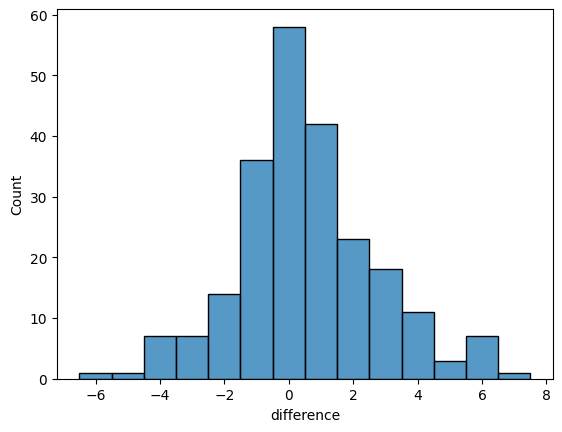

In [24]:
sns.histplot(data=df_degree, x="difference", discrete=True)

## Visualize ccssm as a graph using d3fdgraph library

In [152]:
pip install d3fdgraph

Note: you may need to restart the kernel to use updated packages.


In [150]:
pip install pkg_resources

ERROR: Could not find a version that satisfies the requirement pkg_resources (from versions: none)

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: /home/chase/documents/ccss/bin/python -m pip install --upgrade pip
ERROR: No matching distribution found for pkg_resources
Note: you may need to restart the kernel to use updated packages.


In [153]:
import d3fdgraph

ModuleNotFoundError: No module named 'pkg_resources'

## Visualize ccssm as a graph using networkx library

In [25]:
pip install networkx[default,extra]

  Using cached lxml-5.3.0-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (3.8 kB)
  Using cached pygraphviz-1.14.tar.gz (106 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pydot-3.0.3-py3-none-any.whl.metadata (10 kB)
  Using cached sympy-1.13.3-py3-none-any.whl.metadata (12 kB)
  Using cached mpmath-1.3.0-py3-none-any.whl.metadata (8.6 kB)
Using cached lxml-5.3.0-cp312-cp312-manylinux_2_28_x86_64.whl (4.9 MB)
Using cached pydot-3.0.3-py3-none-any.whl (35 kB)
Using cached sympy-1.13.3-py3-none-any.whl (6.2 MB)
Using cached mpmath-1.3.0-py3-none-any.whl (536 kB)
  error: subprocess-exited-with-error
  
  × Building wheel for pygraphviz (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [58 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build/lib.linux-x86_64-cpython-312/pygraphviz
      copying pygraphviz/__init__

In [26]:
import networkx as nx

In [27]:
G = nx.DiGraph()

In [28]:
NodeList = [(std, {"Grade": attr[0], "Domain": attr[1], "Description": attr[2]}) for std, attr in zip(df.index.tolist(),df.values.tolist())]

In [29]:
EdgeList = []
for std in df.index.tolist():
    for successor in df.loc[std, "to"]:
        if "HS" not in successor:
            EdgeList.append((std, successor))
EdgeList

[('K.CC.1', 'K.CC.2'),
 ('K.CC.1', 'K.CC.4'),
 ('K.CC.1', '1.NBT.1'),
 ('K.CC.2', 'K.CC.4'),
 ('K.CC.4', 'K.CC.5'),
 ('K.CC.4', '1.OA.5'),
 ('K.CC.5', 'K.CC.6'),
 ('K.CC.6', 'K.CC.7'),
 ('K.CC.6', 'K.MD.3'),
 ('K.CC.7', '1.NBT.3'),
 ('K.OA.1', 'K.OA.2'),
 ('K.OA.2', 'K.OA.3'),
 ('K.OA.2', '1.OA.1'),
 ('K.OA.2', '1.OA.3'),
 ('K.OA.2', '1.OA.4'),
 ('K.OA.2', '1.OA.6'),
 ('K.OA.3', 'K.OA.4'),
 ('K.OA.3', 'K.OA.5'),
 ('K.OA.3', 'K.NBT.1'),
 ('K.OA.3', '1.OA.6'),
 ('K.OA.4', '1.OA.6'),
 ('K.OA.5', '1.OA.6'),
 ('K.NBT.1', '1.NBT.2'),
 ('K.MD.1', 'K.MD.2'),
 ('K.MD.2', 'K.MD.3'),
 ('K.MD.2', '1.MD.1'),
 ('K.MD.3', '1.MD.4'),
 ('K.G.1', 'K.G.4'),
 ('K.G.1', 'K.G.5'),
 ('K.G.2', 'K.G.4'),
 ('K.G.2', 'K.G.5'),
 ('K.G.3', 'K.G.4'),
 ('K.G.3', 'K.G.5'),
 ('K.G.4', '1.G.1'),
 ('K.G.5', '1.G.1'),
 ('K.G.6', '1.G.2'),
 ('1.OA.1', '1.OA.2'),
 ('1.OA.1', '1.MD.4'),
 ('1.OA.1', '2.OA.1'),
 ('1.OA.2', '1.MD.4'),
 ('1.OA.3', '1.OA.6'),
 ('1.OA.3', '2.NBT.9'),
 ('1.OA.3', '4.NF.3'),
 ('1.OA.3', '6.EE.3'),


In [30]:
G.clear()
G.add_nodes_from(NodeList)
G.add_edges_from(EdgeList)

In [31]:
G.number_of_nodes()

229

In [32]:
G.number_of_edges()

403

In [33]:
G.nodes

NodeView(('K.CC.1', 'K.CC.2', 'K.CC.3', 'K.CC.4', 'K.CC.5', 'K.CC.6', 'K.CC.7', 'K.OA.1', 'K.OA.2', 'K.OA.3', 'K.OA.4', 'K.OA.5', 'K.NBT.1', 'K.MD.1', 'K.MD.2', 'K.MD.3', 'K.G.1', 'K.G.2', 'K.G.3', 'K.G.4', 'K.G.5', 'K.G.6', '1.OA.1', '1.OA.2', '1.OA.3', '1.OA.4', '1.OA.5', '1.OA.6', '1.OA.7', '1.OA.8', '1.NBT.1', '1.NBT.2', '1.NBT.3', '1.NBT.4', '1.NBT.5', '1.NBT.6', '1.MD.1', '1.MD.2', '1.MD.3', '1.MD.4', '1.G.1', '1.G.2', '1.G.3', '2.OA.1', '2.OA.2', '2.OA.3', '2.OA.4', '2.NBT.1', '2.NBT.2', '2.NBT.3', '2.NBT.4', '2.NBT.5', '2.NBT.6', '2.NBT.7', '2.NBT.8', '2.NBT.9', '2.MD.1', '2.MD.2', '2.MD.3', '2.MD.4', '2.MD.5', '2.MD.6', '2.MD.7', '2.MD.8', '2.MD.9', '2.MD.10', '2.G.1', '2.G.2', '2.G.3', '3.OA.1', '3.OA.2', '3.OA.3', '3.OA.4', '3.OA.5', '3.OA.6', '3.OA.7', '3.OA.8', '3.OA.9', '3.NBT.1', '3.NBT.2', '3.NBT.3', '3.NF.1', '3.NF.2', '3.NF.3', '3.MD.1', '3.MD.2', '3.MD.3', '3.MD.4', '3.MD.5', '3.MD.6', '3.MD.7', '3.MD.8', '3.G.1', '3.G.2', '4.OA.1', '4.OA.2', '4.OA.3', '4.OA.4', '4.O

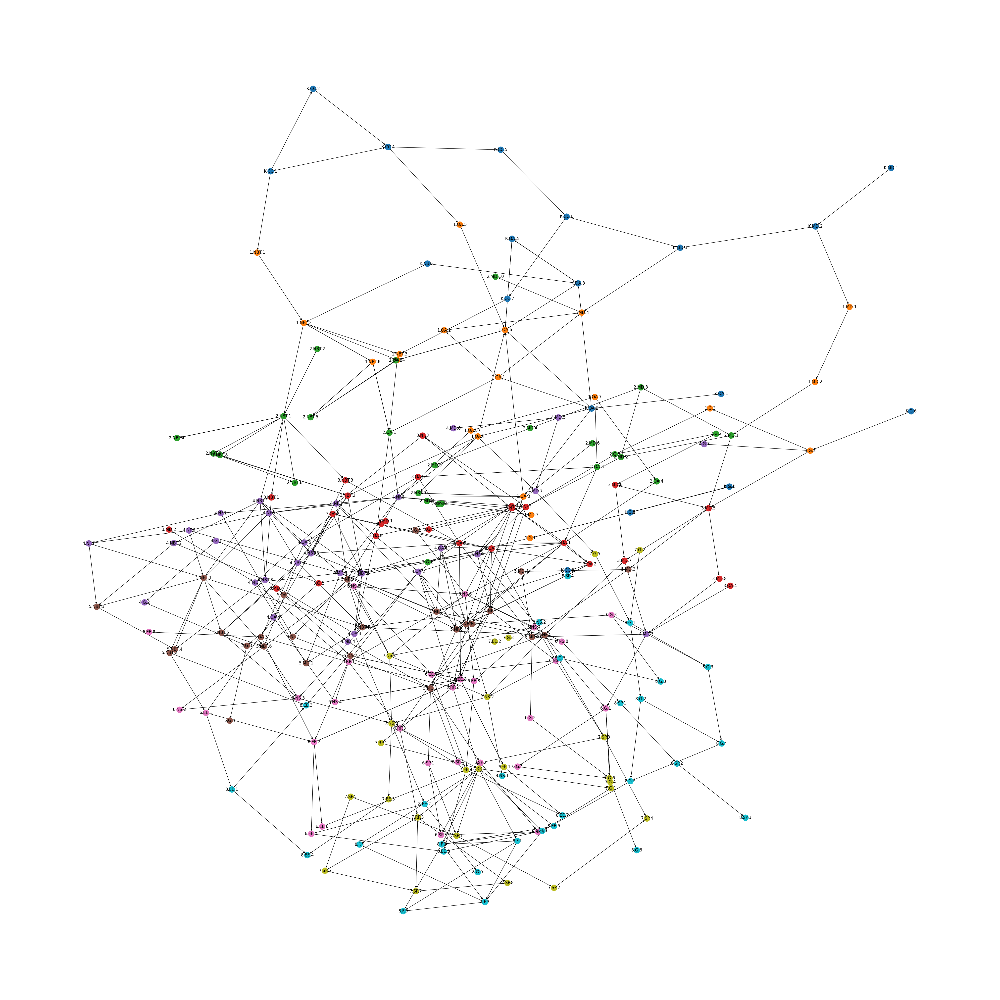

In [34]:
fig = plt.figure(figsize=(40,40))
nx.draw_kamada_kawai(G, with_labels=True, node_color = [colordict[df.loc[std,"grade"]] for std in G.nodes])

In [35]:
import numpy as np

In [36]:
pos = nx.kamada_kawai_layout(G)

In [37]:
pos

{'K.CC.1': array([-0.25429117,  0.83010795]),
 'K.CC.2': array([-0.19673051,  1.        ]),
 'K.CC.3': array([0.14761635, 0.00813388]),
 'K.CC.4': array([-0.09536612,  0.88028871]),
 'K.CC.5': array([0.0571135 , 0.87450266]),
 'K.CC.6': array([0.14631713, 0.73666137]),
 'K.CC.7': array([0.06620928, 0.5675313 ]),
 'K.OA.1': array([0.35548284, 0.37169585]),
 'K.OA.2': array([0.18014852, 0.34146246]),
 'K.OA.3': array([0.16188669, 0.59932528]),
 'K.OA.4': array([0.07247039, 0.69111381]),
 'K.OA.5': array([0.07247094, 0.69111365]),
 'K.NBT.1': array([-0.04204709,  0.63997163]),
 'K.MD.1': array([0.58554962, 0.83727706]),
 'K.MD.2': array([0.48326026, 0.71649776]),
 'K.MD.3': array([0.29997808, 0.67269631]),
 'K.G.1': array([0.36657026, 0.18056984]),
 'K.G.2': array([0.36660155, 0.18049066]),
 'K.G.3': array([0.36663164, 0.18041436]),
 'K.G.4': array([0.23227477, 0.12742172]),
 'K.G.5': array([0.23226687, 0.12744193]),
 'K.G.6': array([0.61268879, 0.33572387]),
 '1.OA.1': array([0.05387368,

In [38]:
kpos = {k:np.array([-v[1], v[0]]) for k,v in pos.items()}
kpos

{'K.CC.1': array([-0.83010795, -0.25429117]),
 'K.CC.2': array([-1.        , -0.19673051]),
 'K.CC.3': array([-0.00813388,  0.14761635]),
 'K.CC.4': array([-0.88028871, -0.09536612]),
 'K.CC.5': array([-0.87450266,  0.0571135 ]),
 'K.CC.6': array([-0.73666137,  0.14631713]),
 'K.CC.7': array([-0.5675313 ,  0.06620928]),
 'K.OA.1': array([-0.37169585,  0.35548284]),
 'K.OA.2': array([-0.34146246,  0.18014852]),
 'K.OA.3': array([-0.59932528,  0.16188669]),
 'K.OA.4': array([-0.69111381,  0.07247039]),
 'K.OA.5': array([-0.69111365,  0.07247094]),
 'K.NBT.1': array([-0.63997163, -0.04204709]),
 'K.MD.1': array([-0.83727706,  0.58554962]),
 'K.MD.2': array([-0.71649776,  0.48326026]),
 'K.MD.3': array([-0.67269631,  0.29997808]),
 'K.G.1': array([-0.18056984,  0.36657026]),
 'K.G.2': array([-0.18049066,  0.36660155]),
 'K.G.3': array([-0.18041436,  0.36663164]),
 'K.G.4': array([-0.12742172,  0.23227477]),
 'K.G.5': array([-0.12744193,  0.23226687]),
 'K.G.6': array([-0.33572387,  0.61268

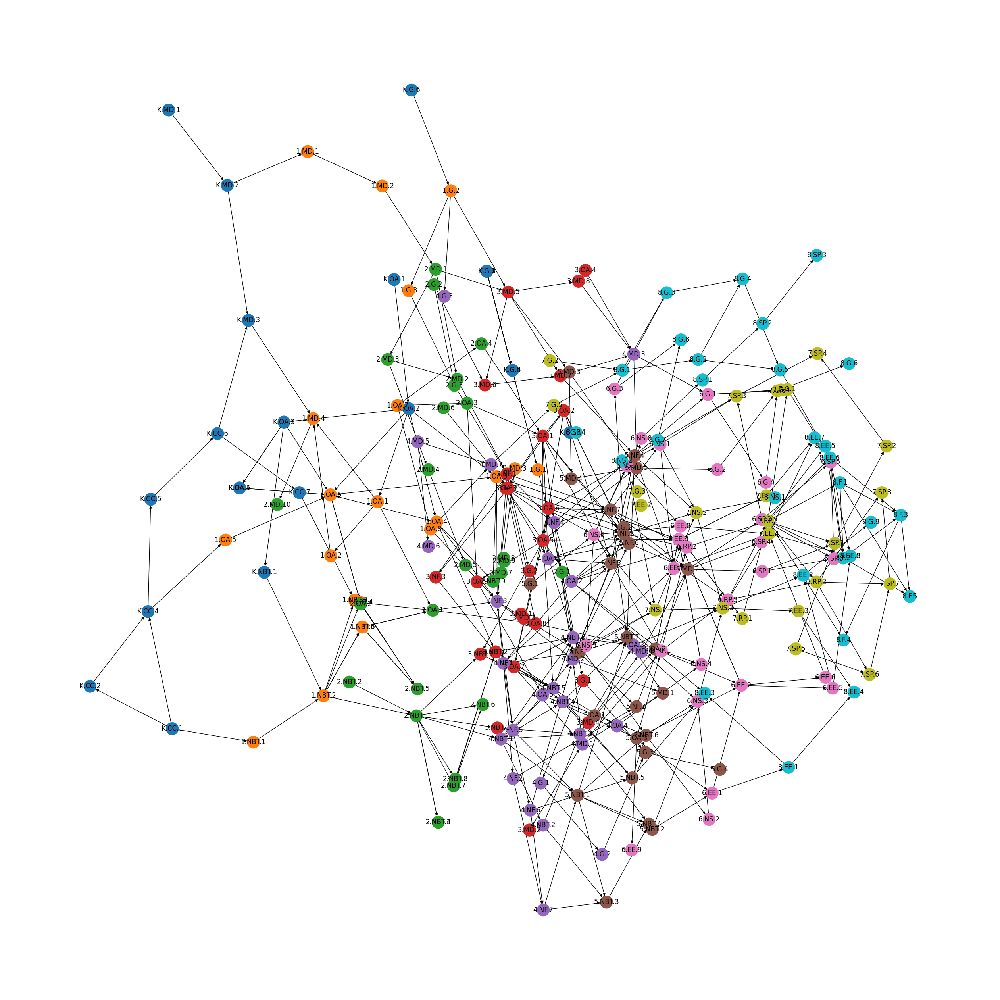

In [39]:
fig = plt.figure(figsize=(25,25))
nx.draw(G, pos=kpos, with_labels=True, node_color = [colordict[df.loc[std,"grade"]] for std in G.nodes], node_size=500)

In [254]:
import matplotlib.cm as cm

In [280]:
def graph_nx(G, size=25, node_size=500, color_func = lambda std: colordict[df.loc[std,"grade"]], cmap=None):
    pos = nx.kamada_kawai_layout(G)
    rot_pos = {k:np.array([-v[1], v[0]]) for k,v in pos.items()}
    fig = plt.figure(figsize=(size,size))
    ax = plt.subplot()
    nx.draw(G, pos=kpos, with_labels=True, node_color = [color_func(std) for std in G.nodes], node_size=node_size, cmap=cmap, ax=ax)
    #plt.colorbar(cm.ScalarMappable(cmap=cmap), ax=ax, shrink=0.25)
    print(ax.artists)
    #plt.legend()
    plt.show()

<Axes.ArtistList of 0 artists>


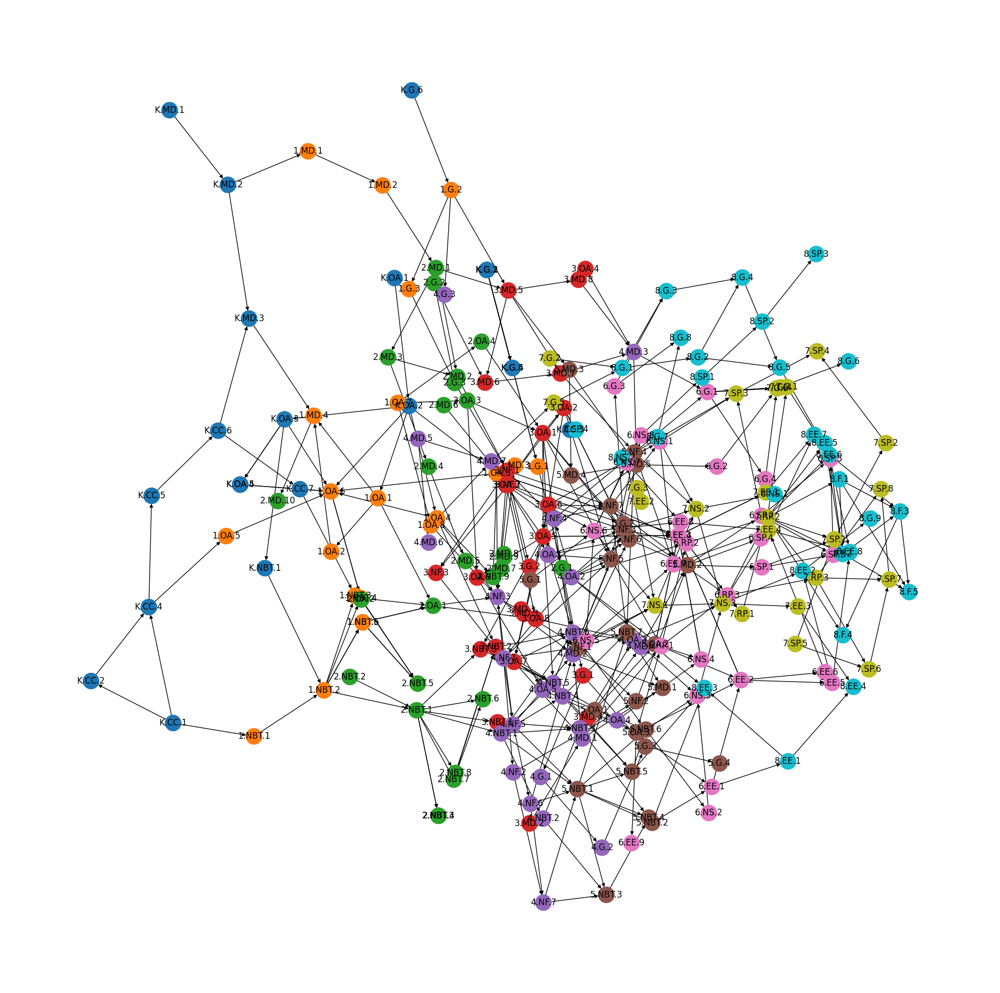

In [281]:
graph_nx(G)

## Analyze standard prerequisites

In [99]:
def get_prereqs(stds):
    prereqs = set()
    for std in stds:
        std_prereqs = df.loc[std, "from"]
        prereqs.update(std_prereqs)
        prereqs.update(get_prereqs(std_prereqs))
    return prereqs

In [102]:
get_prereqs(["4.NF.1"])

{'1.G.2',
 '1.G.3',
 '1.MD.1',
 '1.MD.2',
 '1.OA.7',
 '2.G.2',
 '2.G.3',
 '2.MD.1',
 '2.MD.2',
 '2.MD.3',
 '2.MD.6',
 '2.OA.3',
 '2.OA.4',
 '3.NF.1',
 '3.NF.2',
 '3.NF.3',
 '3.OA.1',
 '3.OA.2',
 '3.OA.3',
 '4.OA.2',
 'K.G.6',
 'K.MD.1',
 'K.MD.2'}

In [287]:
def graph_prereqs(stds):
    prereqs = stds
    prereqs.extend(get_prereqs(stds))
    std_graph = G.subgraph(prereqs)
    graph_nx(std_graph)

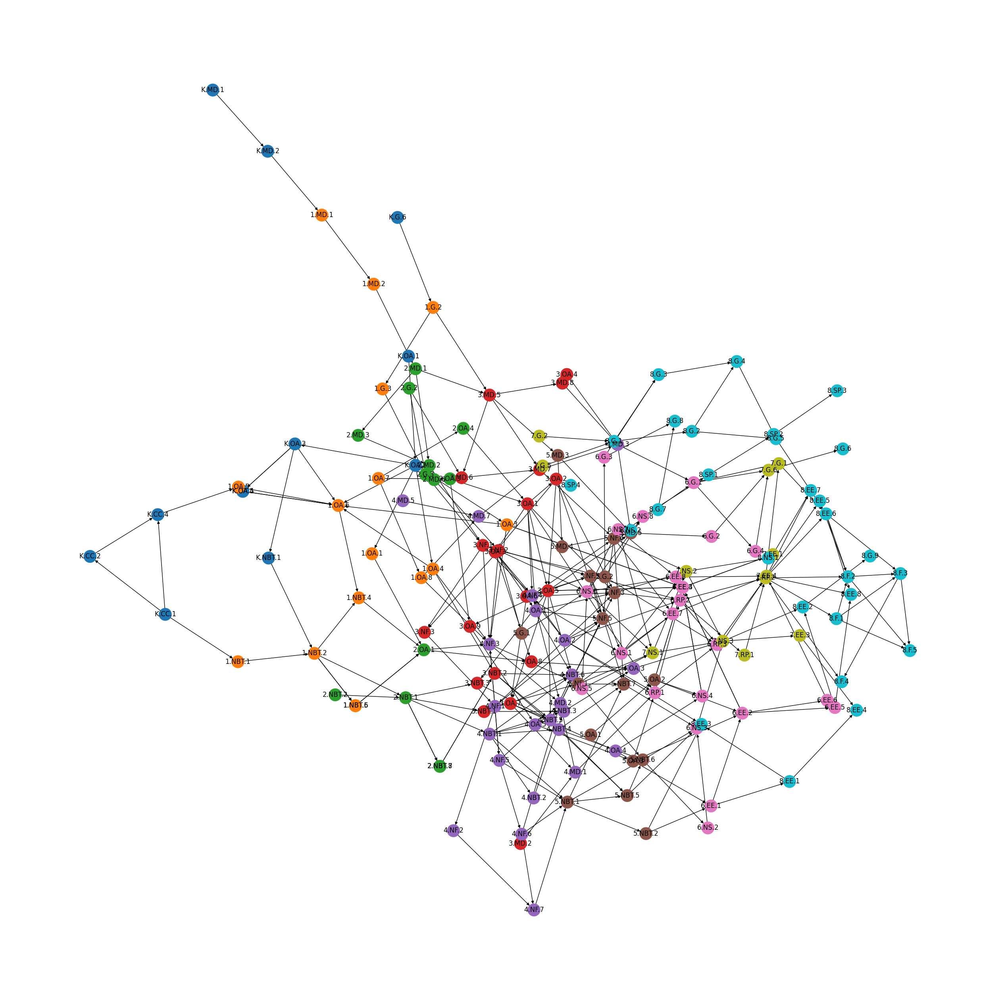

In [166]:
prereqs(df.loc[df["grade"] == "8th Grade"].index.to_list())

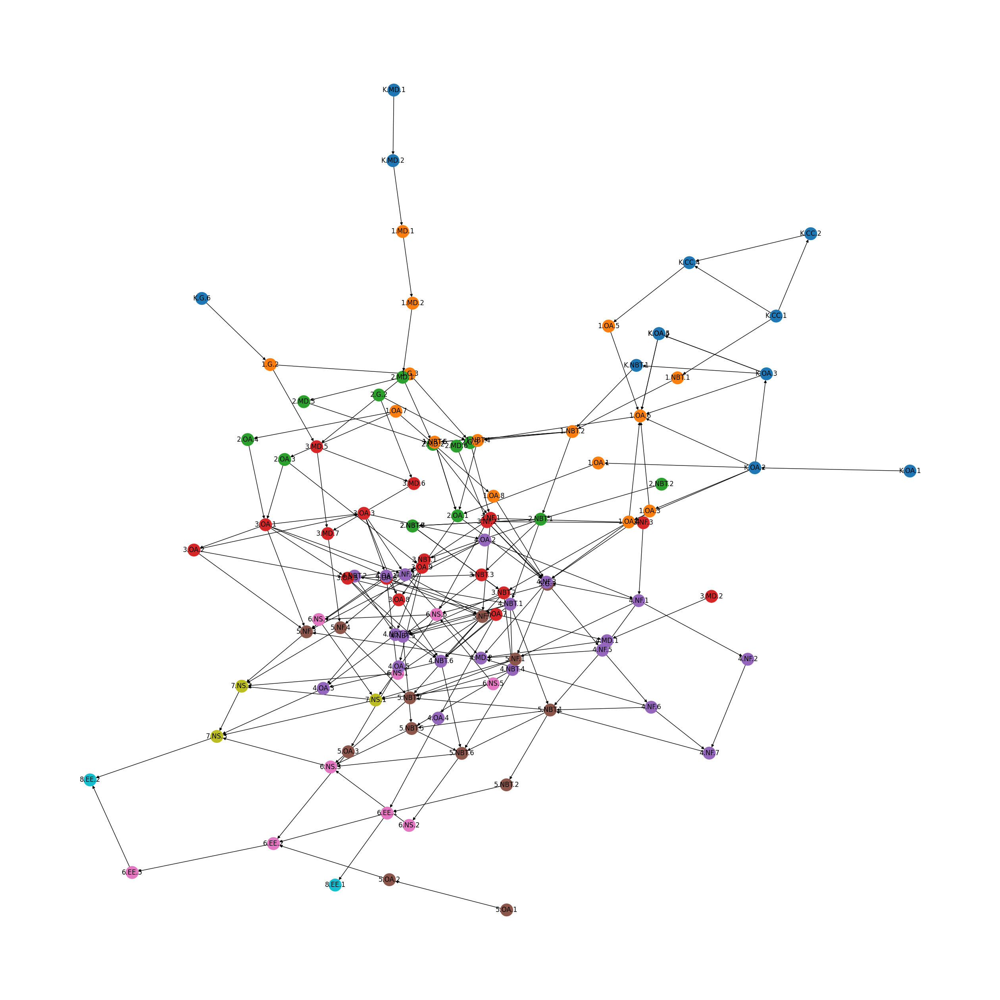

In [105]:
prereqs(["8.EE.1", "8.EE.2"])

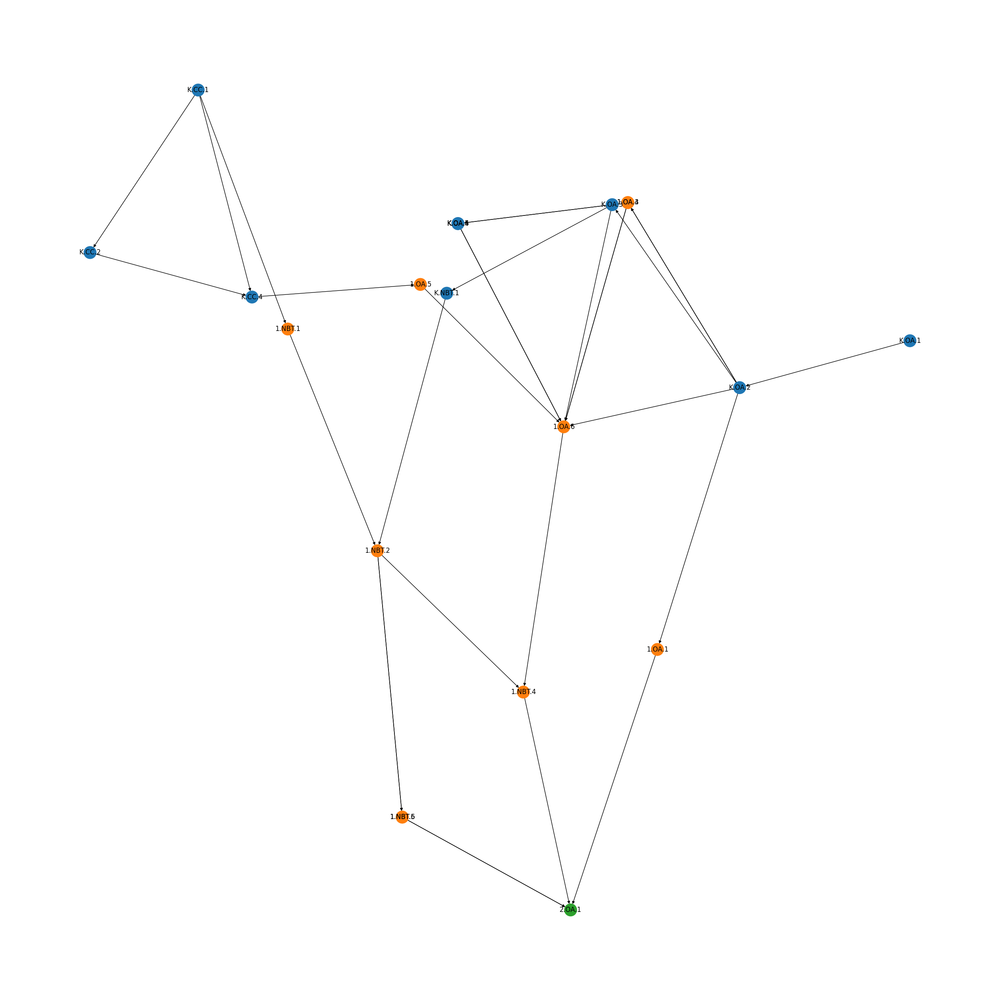

In [107]:
prereqs(["2.OA.1"])

In [137]:
g8_prereqs = df.loc[df["grade"] == "8th Grade"].index.astype("string").to_list()

In [138]:
g8_prereqs.extend(list(get_prereqs(g8_prereqs)))

In [140]:
all_stds = df.index.to_list()

In [142]:
g8_complement = list(set(all_stds) - set(g8_prereqs))
df.loc[g8_complement]

,grade,domain,description,from,to
name,,,,,
2.MD.10,2nd Grade,Measurement and Data,Draw a picture graph and a bar graph (with sin...,[1.MD.4],[]
2.NBT.4,2nd Grade,Number and Operations in Base Ten,Compare two three-digit numbers based on meani...,[2.NBT.1],[]
K.G.2,Kindergarten,Geometry,Correctly name shapes regardless of their orie...,[],"[K.G.4, K.G.5]"
2.NBT.3,2nd Grade,Number and Operations in Base Ten,Read and write numbers to 1000 using base-ten ...,[2.NBT.1],[]
7.G.4,7th Grade,Geometry,Know the formulas for the area and circumferen...,[6.G.1],"[HS.G-C.5, HS.G-GMD.1, HS.G-MG.1, HS.G-MG.3]"
...,...,...,...,...,...
K.CC.5,Kindergarten,Counting and Cardinality,Count to answer “how many?” questions about as...,[K.CC.4],[K.CC.6]
5.G.4,5th Grade,Geometry,Classify two-dimensional figures in a hierarch...,[5.G.3],[]
6.SP.5,6th Grade,Statistics and Probability,Summarize numerical data sets in relation to t...,"[6.SP.2, 6.SP.3]","[HS.S-IC.6, HS.S-ID.2, HS.S-ID.3]"


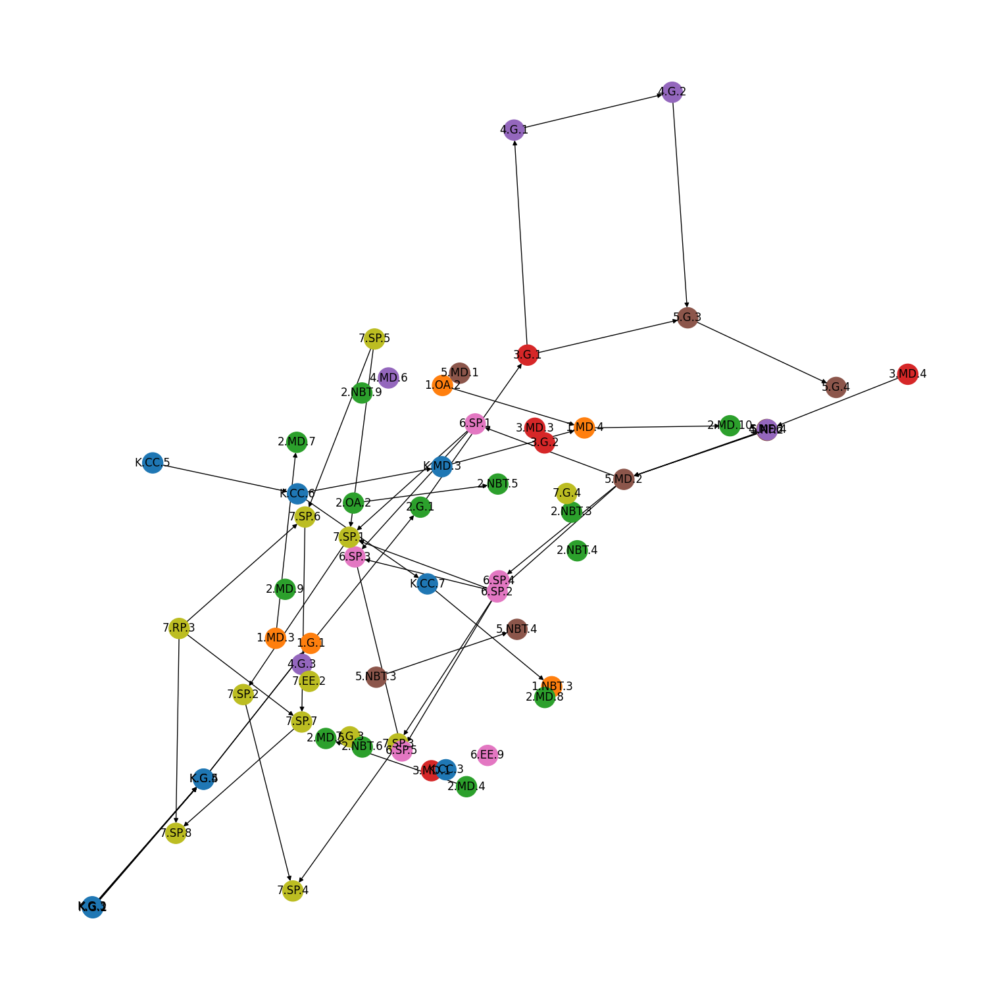

In [147]:
g8_complement_graph = G.subgraph(g8_complement)
fig = plt.figure(figsize=(15,15))
nx.draw_kamada_kawai(g8_complement_graph, with_labels=True, node_color = [colordict[df.loc[std,"grade"]] for std in g8_complement_graph.nodes], node_size=500)
plt.show()

<Axes.ArtistList of 0 artists>


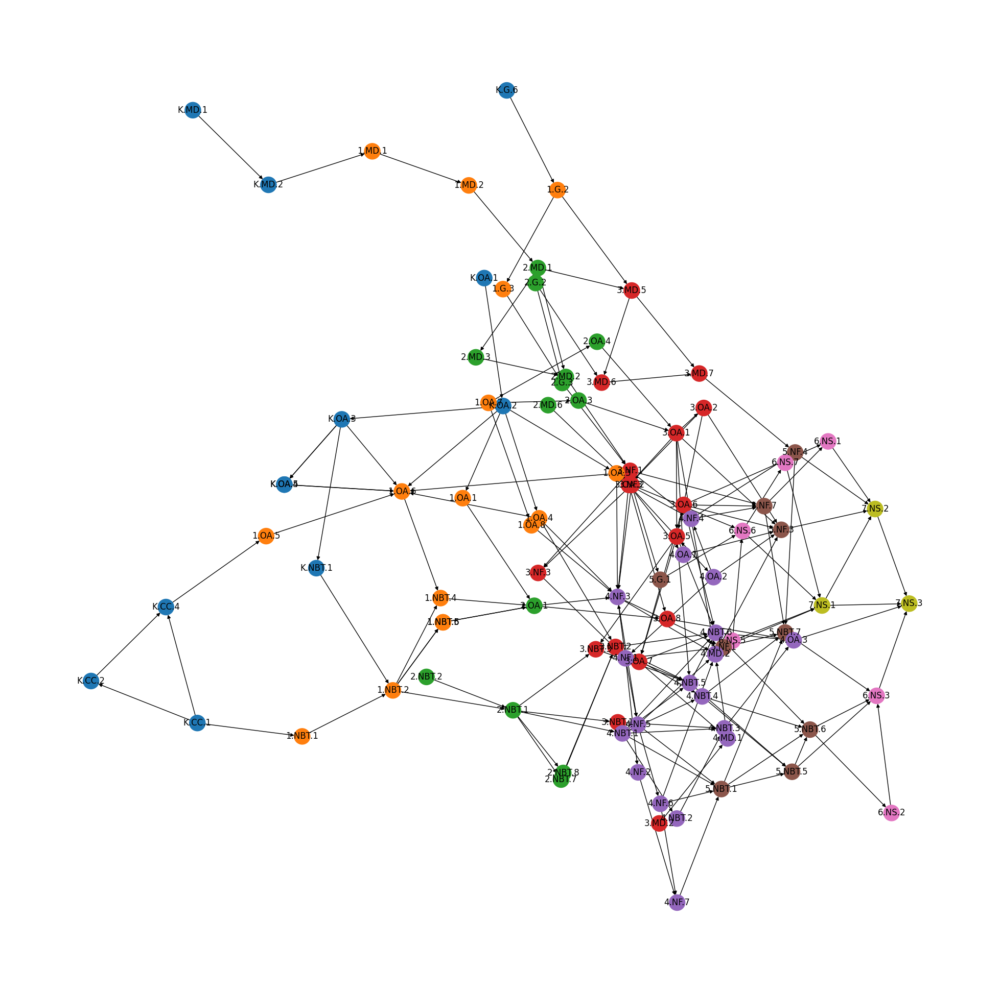

In [289]:
graph_prereqs(["7.NS.1", "7.NS.2", "7.NS.3"])

## Bayesian Prediction of Mastery

In [155]:
import scipy.stats as stats

In [238]:
mastery = dict.fromkeys(df.index.astype("string").to_list(), stats.beta(1,1))

/tmp/ipykernel_2261/4211546447.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


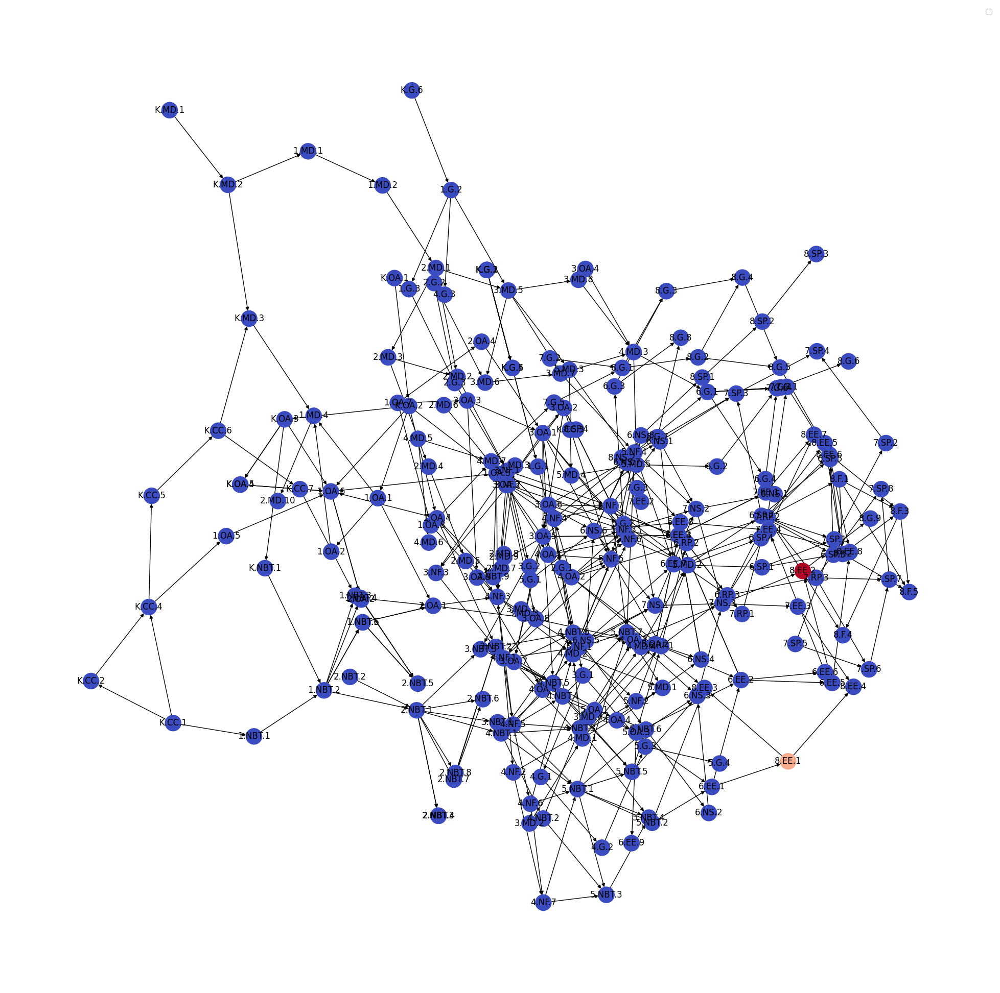

In [279]:
graph_nx(G, color_func = lambda x: 1 - mastery[x].cdf(.9), cmap=sns.color_palette("coolwarm", as_cmap=True))

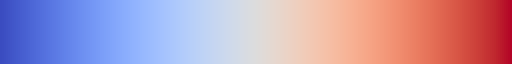

In [249]:
sns.color_palette("coolwarm", as_cmap=True)

In [246]:
mastery["8.EE.2"] = stats.beta(mastery["8.EE.1"].args[0] + 1.0, mastery["8.EE.1"].args[1])

In [237]:
mastery["8.EE.1"].args[0]

2.0